In [1]:
# import numpy as np
# import pandas as pd

# import matplotlib.pyplot as plt
# import seaborn as sns


# import scanpy as sc
# import anndata as ad

# from matplotlib.colors import rgb2hex
# import seaborn as sns

# import os
# # BASE_DIR = '/lustre/scratch124/cellgen/haniffa/projects/developmental_fibroblasts/nobackup_output/nichecompasss/nichecompass/artifacts/spatial_reference_mapping/20250901_092842XeniumHDCA_1024svg_n8/model/reference/'
# # os.listdir(BASE_DIR)

# import matplotlib
# matplotlib.rcParams['pdf.fonttype'] = 42
# matplotlib.rcParams['ps.fonttype'] = 42
# #%matplotlib inline
# sc.settings.figdir = "niche_figure"
 
# sc.settings.set_figure_params(dpi=50, dpi_save=300, facecolor="white", frameon=False, figsize=(18,18),
#                                    vector_friendly=True
#                              )
import scanpy as sc
import anndata as ad

import rapids_singlecell as rsc
import rmm
import cupy as cp
from rmm.allocators.cupy import rmm_cupy_allocator
 
rmm.reinitialize(managed_memory=True, pool_allocator=False)
cp.cuda.set_allocator(rmm_cupy_allocator)
sc.settings.set_figure_params(dpi=50, dpi_save=300, facecolor="white", frameon=False, figsize=(18,18),
                                   vector_friendly=True
                             )

/software/cellgen/team298/ls34/rapids_sc2/lib/python3.13/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
import matplotlib
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42
#%matplotlib inline
sc.settings.figdir = "nc_figures"
sc.settings.set_figure_params(dpi_save=300, facecolor="white", frameon=False, figsize=(18,18))


In [3]:
runs = [
#    "20260208_033923BEACON_TIME_svg2048_neighbors4_epochs200",
   # "20260208_055517BEACON_TIME_svg2048_neighbors16_epochs200",
   # "20260208_074910BEACON_TIME_svg1024_neighbors4_epochs200",
   # "20260208_141910BEACON_TIME_svg1024_neighbors16_epochs200",
   # "20260209_001638BEACON_TIME_svg2048_neighbors16_epochs200",
    
    
    
    
    
        #"20260208_034009BEACON_TIME_svg2048_neighbors8_epochs200",
       # "20260208_105637BEACON_TIME_svg1024_neighbors8_epochs200",
    
    '20260214_105049BEACON_TIME_svg1024_neighbors4_epochs200',
 '20260214_105112BEACON_TIME_svg2048_neighbors4_epochs200',
  '20260214_105424BEACON_TIME_svg2048_neighbors16_epochs200',
 '20260214_105701BEACON_TIME_svg1024_neighbors16_epochs200',
]

In [4]:
import os
MODEL = '20260208_033923BEACON_TIME_svg2048_neighbors4_epochs200'
BASE=f'/lustre/scratch124/cellgen/haniffa/projects/developmental_fibroblasts/nobackup_output/nichecompasss/nichecompass/artifacts/spatial_reference_mapping/{MODEL}/model/reference/'
os.listdir(BASE)


['attr.pkl', 'adata.h5ad', 'var_names.csv', 'model_params.pt']

In [5]:
BASE  + '/adata.h5ad'

'/lustre/scratch124/cellgen/haniffa/projects/developmental_fibroblasts/nobackup_output/nichecompasss/nichecompass/artifacts/spatial_reference_mapping/20260208_033923BEACON_TIME_svg2048_neighbors4_epochs200/model/reference//adata.h5ad'

In [6]:
# adata=sc.read_h5ad(BASE  + '/adata.h5ad' )
# adata.shape

In [7]:
# adata.obs["niche19"].isna().sum()

In [8]:

colors_new2 = {
        'Epidermis_basal': "#4a538f",# "#3489f1", #"#000080", #"#f0f8ff", #"#007cfe",#'#4f59a1',  # dark blue
    "Epidermis basal":"#3489f1",# "#000080", #"#f0f8ff", #"#000080",
    
                'Epidermis_mid': '#F0F8FF', # #e3e7eb - GREY
  #  "Epidermis_late": "#4682B4", #"#A52A2A",          # pink
            'Epidermis_late':"#2a2f5c",#"#2a2f5c" ,# "#2e2e2e",#'#b1dae6',  # light blue

   'Epidermis basal_cycling': "#007cfe",  #  e2d8dd   "#505aa1",#"#c590a5" , # '#e0c5d2',
'Epidermis_basal_cycling': "#007cfe", 
'EpidermisInflamm_mid':"#f6e3ec",
        'EpidermisInflamm_late': "#800020",
    
    
    # 'Epidermis_Inflammatory': '#f2e7ed',
        "Epidermis_APChi": "#ff1493",
    'Papillary_dermis':"#FFFF00", # "#f6d17a", # yellow
    
  #  'Perivascular':  "#845DAE", #  '#fedbe7' PINKSIH,  #'#f8daeb',  # darkish red
    'Small blood vessel': "#d73435", #'#fe78bb',  # bright red
    'Sweat_gland': '#008080',  # dark grey
        'Sweat_gland_channel': "#adf7e8", #'#008080',  # original - 40E0D0
    'Muscle': "#f371af",  # very dark red
    'Adipocyte+vessels': "#B8860B", #'#FF4500',  # very dark orange
     'Hypodermis': "#FFFFF0", #"#D2B48C",#' # yello  # white = '#ffffff',
    'Larger blood vessel': "#660000",#"#8B0000", #'#FF6347',  # coral red
    'Perineural': '#0A0A0A',  # almost black
   # 'Plasma+pDC': '#808080',  # bright turquoise
    #'Sweat gland channel': '#000000',  # black
    #'KC_immunecell': '#FF1493',  # dark pink
    
   # 'Epidermis_late': '#b1dae6',
    "Nonspecific":"#D3D3D3",
     'Reticular_dermis': '#d0e1f2',

 'Large_BV': '#660000',
 'Small_BV': "#c43f40",#'#D96B6B',
     'Tzone-like': "#845DAE",# '#F4D1A1',

 'Sebaceous_gland': "#FFD9A3",      #  "#FFB347",#"#94cb72",#'#e28743',
"Sebaceous_immune": "#ff6145", 
 #'Plasma_cell_niche': "#1F51FF", #"#FFB300",#"#40E0D0",#'#ff5e00',
   # 'Plasma_cell_rich':  "#8080B2", #"
"Plasma_cell_rich": "#04D9FF",
    'HF_Perineural': '#00FF00',
    "OuterHF": "#006600",# 
 'Sebaceous duct': '#e28743',


"Lymphoid Tzone-like": "#825bac",
    



     #007FFF
    "Reticular_dermis_LE_rich" : "#6A8ED8",
        "Reticular_dermis_LErich" : "#6A8ED8",
    "Small_BV_Trich": "#FFB6C1",          # neon orange
    "Tzone-like_Theavy": "#B19CD9",       # light purple
    #"Reticular dermis_F2/F3hi": "#35476C", #"#FF5F1F",# light blue
    "HF_outer": "#90c670",                # very dark green
    "VenuleMuscle": "#B34A7E",

    "Sebaceous_duct": "#FFA07A",          # light orange (salmony)
    "VenuleEndothelium": "#8B0000",       # dark red
    "HF_inner": "#90EE90",                 # light green
    "HF_TNN+COCH+hi": "#39FF14",          # neon green
    # "Peri_sweat_gland": "#d9f9f7",
    'HF_innermost':  "#D95D54",
  #  'Sebaceous_inner_immune':"#F6A85C",
    'Nonspecific/folded': "#F0F0F0",
 'nan': '#FAFAFA',
        'Epidermis_basal': "#4a538f",# "#3489f1", #"#000080", #"#f0f8ff", #"#007cfe",#'#4f59a1',  # dark blue
    "Epidermis basal":"#3489f1",# "#000080", #"#f0f8ff", #"#000080",
    
                'Epidermis_mid': '#F0F8FF', # #e3e7eb - GREY
  #  "Epidermis_late": "#4682B4", #"#A52A2A",          # pink
            'Epidermis_late':"#2a2f5c",#"#2a2f5c" ,# "#2e2e2e",#'#b1dae6',  # light blue

   'Epidermis basal_cycling': "#007cfe",  #  e2d8dd   "#505aa1",#"#c590a5" , # '#e0c5d2',
'Epidermis_basal_cycling': "#007cfe", 
'EpidermisInflamm_mid':"#f6e3ec",
        'EpidermisInflamm_late': "#800020",
    
    
    # 'Epidermis_Inflammatory': '#f2e7ed',
        "Epidermis_APChi": "#ff1493",
    'Papillary_dermis':"#FFFF00", # "#f6d17a", # yellow
    
  #  'Perivascular':  "#845DAE", #  '#fedbe7' PINKSIH,  #'#f8daeb',  # darkish red
    'Small blood vessel': "#d73435", #'#fe78bb',  # bright red
    'Sweat_gland': '#008080',  # dark grey
        'Sweat_gland_channel': "#adf7e8", #'#008080',  # original - 40E0D0
    'Muscle': "#f371af",  # very dark red
    'Adipocyte+vessels': "#B8860B", #'#FF4500',  # very dark orange
     'Hypodermis': "#FFFFF0", #"#D2B48C",#' # yello  # white = '#ffffff',
    'Larger blood vessel': "#660000",#"#8B0000", #'#FF6347',  # coral red
    'Perineural': '#0A0A0A',  # almost black
   # 'Plasma+pDC': '#808080',  # bright turquoise
    #'Sweat gland channel': '#000000',  # black
    #'KC_immunecell': '#FF1493',  # dark pink
    
   # 'Epidermis_late': '#b1dae6',
    "Nonspecific":"#D3D3D3",
     'Reticular_dermis': '#d0e1f2',

 'Large_BV': '#660000',
 'Small_BV': "#c43f40",#'#D96B6B',
     'Tzone-like': "#845DAE",# '#F4D1A1',

 'Sebaceous_gland': "#FFD9A3",      #  "#FFB347",#"#94cb72",#'#e28743',
"Sebaceous_immune": "#ff6145", 
 #'Plasma_cell_niche': "#1F51FF", #"#FFB300",#"#40E0D0",#'#ff5e00',
   # 'Plasma_cell_rich':  "#8080B2", #"
"Plasma_cell_rich": "#04D9FF",
    'HF_Perineural': '#00FF00',
    "OuterHF": "#006600",# 
 'Sebaceous duct': '#e28743',


"Lymphoid Tzone-like": "#825bac",
    



     #007FFF
    "Reticular_dermis_LE_rich" : "#6A8ED8",
        "Reticular_dermis_LErich" : "#6A8ED8",
    "Small_BV_Trich": "#FFB6C1",          # neon orange
    "Tzone-like_Theavy": "#B19CD9",       # light purple
    #"Reticular dermis_F2/F3hi": "#35476C", #"#FF5F1F",# light blue
    "HF_outer": "#90c670",                # very dark green
    "VenuleMuscle": "#B34A7E",

    "Sebaceous_duct": "#FFA07A",          # light orange (salmony)
    "VenuleEndothelium": "#8B0000",       # dark red
    "HF_inner": "#90EE90",                 # light green
    "HF_TNN+COCH+hi": "#39FF14",          # neon green
    # "Peri_sweat_gland": "#d9f9f7",
    'HF_innermost':  "#D95D54",
  #  'Sebaceous_inner_immune':"#F6A85C",
    'Nonspecific/folded': "#F0F0F0",
 'nan': '#FAFAFA',
     'validation dataset': '#FAFAFA'

    
    }

In [9]:
# sc.pl.umap(
#         adata,
#         color=["niche19"],
#         #legend_loc="on data",
#         s=1,
#         legend_fontsize=10,
#         legend_fontoutline=2,
#         show=False,
#     palette=colors_new2,
#     title=MODEL,
# #     linewidth=0.1,
# #     edgecolor='grey',
    
#   #   palette=["#F2F2F2",   "#87CEEB",    ],
#    #     save="refmap_umap_refquery.pdf"

#     )
# sc.pl.umap(
#         adata,
#         color=["niche19"],
#         legend_loc="on data",
#         s=1,
#         legend_fontsize=10,
#         legend_fontoutline=2,
#         show=False,
#     palette=colors_new2,
#         title=MODEL,

# #     linewidth=0.1,
# #     edgecolor='grey',
    
#   #   palette=["#F2F2F2",   "#87CEEB",    ],
#    #     save="refmap_umap_refquery.pdf"

#     )

In [10]:
9

9

20260214_105049BEACON_TIME_svg1024_neighbors4_epochs200


2026-02-15 17:41:01 | [INFO] maxp pruned
2026-02-15 17:41:01 | [INFO] cmap pruned
2026-02-15 17:41:01 | [INFO] kern dropped
2026-02-15 17:41:01 | [INFO] post pruned
2026-02-15 17:41:01 | [INFO] FFTM dropped
2026-02-15 17:41:01 | [INFO] GPOS pruned
2026-02-15 17:41:01 | [INFO] GSUB pruned
2026-02-15 17:41:01 | [INFO] glyf pruned
2026-02-15 17:41:01 | [INFO] Added gid0 to subset
2026-02-15 17:41:01 | [INFO] Added first four glyphs to subset
2026-02-15 17:41:01 | [INFO] Closing glyph list over 'MATH': 33 glyphs before
2026-02-15 17:41:01 | [INFO] Glyph names: ['.notdef', '.null', 'A', 'B', 'C', 'E', 'I', 'M', 'N', 'O', 'T', 'b', 'c', 'e', 'five', 'four', 'g', 'h', 'i', 'n', 'nine', 'nonmarkingreturn', 'o', 'one', 'p', 'r', 's', 'six', 'space', 'two', 'underscore', 'v', 'zero']
2026-02-15 17:41:01 | [INFO] Glyph IDs:   [0, 1, 2, 3, 19, 20, 21, 23, 24, 25, 28, 36, 37, 38, 40, 44, 48, 49, 50, 55, 66, 69, 70, 72, 74, 75, 76, 81, 82, 83, 85, 86, 89]
2026-02-15 17:41:01 | [INFO] Closed glyph li

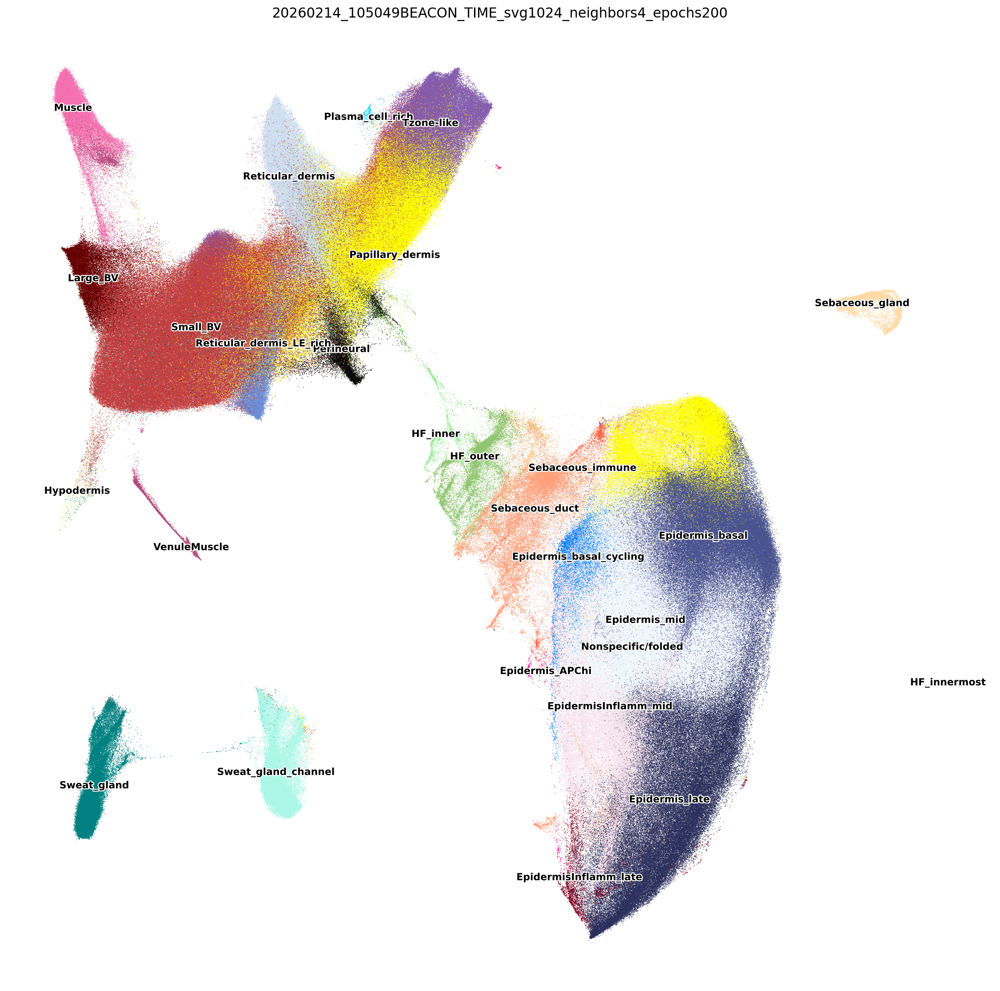

20260214_105112BEACON_TIME_svg2048_neighbors4_epochs200


2026-02-15 17:43:47 | [INFO] maxp pruned
2026-02-15 17:43:47 | [INFO] cmap pruned
2026-02-15 17:43:47 | [INFO] kern dropped
2026-02-15 17:43:47 | [INFO] post pruned
2026-02-15 17:43:47 | [INFO] FFTM dropped
2026-02-15 17:43:47 | [INFO] GPOS pruned
2026-02-15 17:43:47 | [INFO] GSUB pruned
2026-02-15 17:43:47 | [INFO] glyf pruned
2026-02-15 17:43:47 | [INFO] Added gid0 to subset
2026-02-15 17:43:47 | [INFO] Added first four glyphs to subset
2026-02-15 17:43:47 | [INFO] Closing glyph list over 'MATH': 33 glyphs before
2026-02-15 17:43:47 | [INFO] Glyph names: ['.notdef', '.null', 'A', 'B', 'C', 'E', 'I', 'M', 'N', 'O', 'T', 'b', 'c', 'e', 'eight', 'five', 'four', 'g', 'h', 'i', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'r', 's', 'six', 'space', 'two', 'underscore', 'v', 'zero']
2026-02-15 17:43:47 | [INFO] Glyph IDs:   [0, 1, 2, 3, 19, 20, 21, 23, 24, 25, 27, 36, 37, 38, 40, 44, 48, 49, 50, 55, 66, 69, 70, 72, 74, 75, 76, 81, 82, 83, 85, 86, 89]
2026-02-15 17:43:47 | [INFO] Closed glyph l

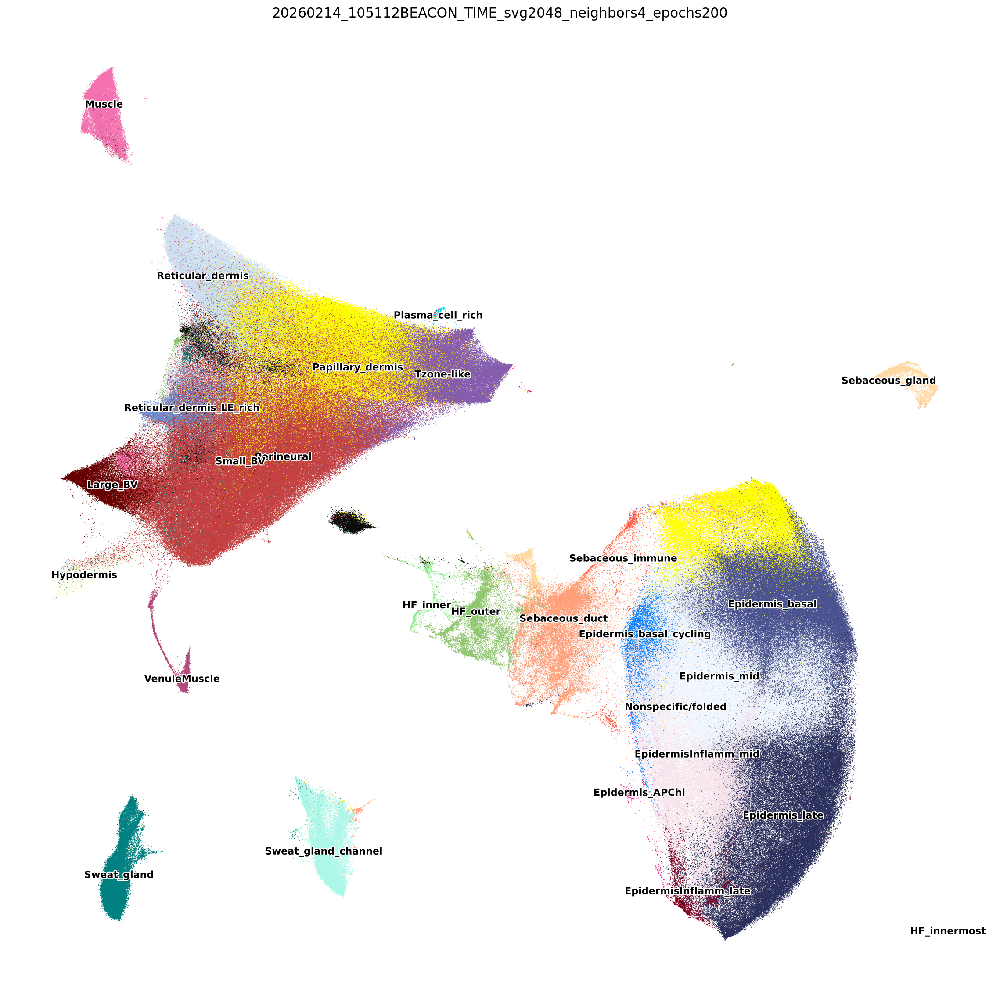

20260214_105424BEACON_TIME_svg2048_neighbors16_epochs200


2026-02-15 17:45:27 | [INFO] maxp pruned
2026-02-15 17:45:27 | [INFO] cmap pruned
2026-02-15 17:45:27 | [INFO] kern dropped
2026-02-15 17:45:27 | [INFO] post pruned
2026-02-15 17:45:27 | [INFO] FFTM dropped
2026-02-15 17:45:27 | [INFO] GPOS pruned
2026-02-15 17:45:27 | [INFO] GSUB pruned
2026-02-15 17:45:28 | [INFO] glyf pruned
2026-02-15 17:45:28 | [INFO] Added gid0 to subset
2026-02-15 17:45:28 | [INFO] Added first four glyphs to subset
2026-02-15 17:45:28 | [INFO] Closing glyph list over 'MATH': 33 glyphs before
2026-02-15 17:45:28 | [INFO] Glyph names: ['.notdef', '.null', 'A', 'B', 'C', 'E', 'I', 'M', 'N', 'O', 'T', 'b', 'c', 'e', 'eight', 'five', 'four', 'g', 'h', 'i', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'r', 's', 'six', 'space', 'two', 'underscore', 'v', 'zero']
2026-02-15 17:45:28 | [INFO] Glyph IDs:   [0, 1, 2, 3, 19, 20, 21, 23, 24, 25, 27, 36, 37, 38, 40, 44, 48, 49, 50, 55, 66, 69, 70, 72, 74, 75, 76, 81, 82, 83, 85, 86, 89]
2026-02-15 17:45:28 | [INFO] Closed glyph l

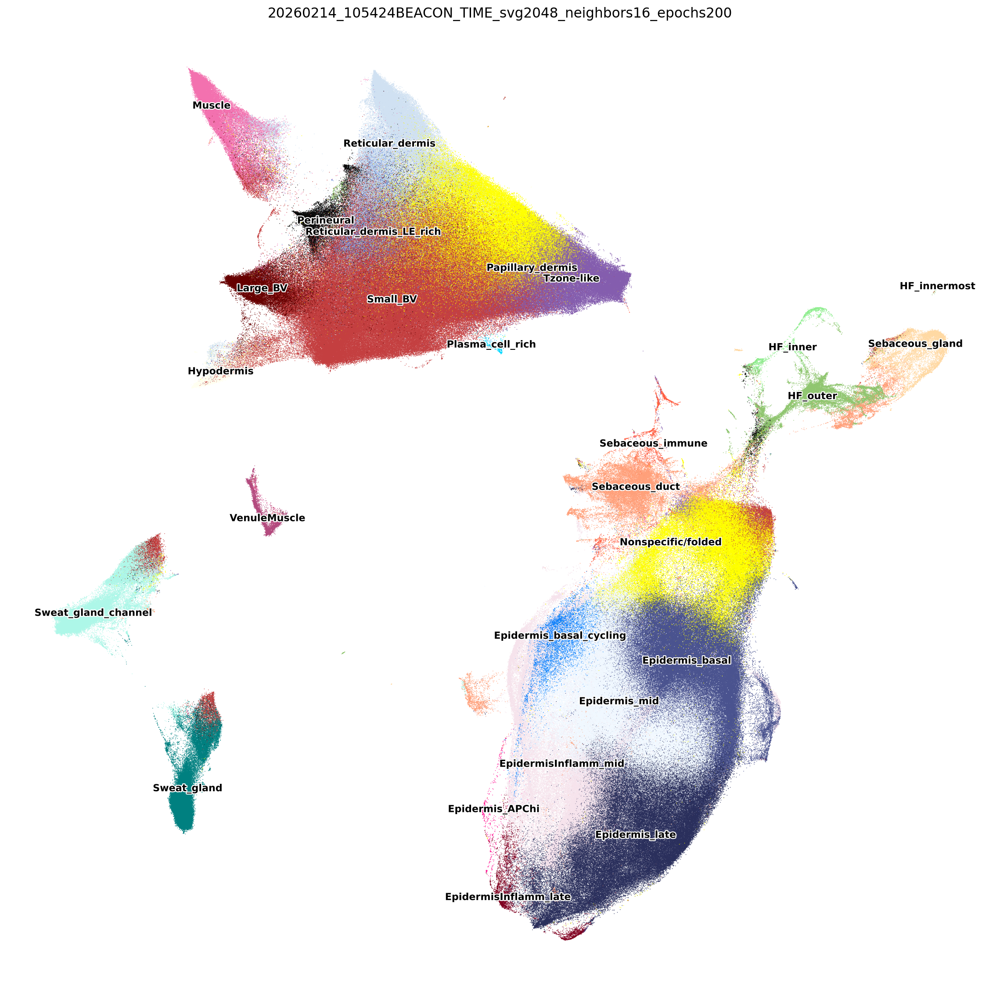

20260214_105701BEACON_TIME_svg1024_neighbors16_epochs200


2026-02-15 17:46:46 | [INFO] maxp pruned
2026-02-15 17:46:46 | [INFO] cmap pruned
2026-02-15 17:46:46 | [INFO] kern dropped
2026-02-15 17:46:46 | [INFO] post pruned
2026-02-15 17:46:46 | [INFO] FFTM dropped
2026-02-15 17:46:46 | [INFO] GPOS pruned
2026-02-15 17:46:46 | [INFO] GSUB pruned
2026-02-15 17:46:46 | [INFO] glyf pruned
2026-02-15 17:46:46 | [INFO] Added gid0 to subset
2026-02-15 17:46:46 | [INFO] Added first four glyphs to subset
2026-02-15 17:46:46 | [INFO] Closing glyph list over 'MATH': 33 glyphs before
2026-02-15 17:46:46 | [INFO] Glyph names: ['.notdef', '.null', 'A', 'B', 'C', 'E', 'I', 'M', 'N', 'O', 'T', 'b', 'c', 'e', 'five', 'four', 'g', 'h', 'i', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'r', 's', 'seven', 'six', 'space', 'two', 'underscore', 'v', 'zero']
2026-02-15 17:46:46 | [INFO] Glyph IDs:   [0, 1, 2, 3, 19, 20, 21, 23, 24, 25, 26, 36, 37, 38, 40, 44, 48, 49, 50, 55, 66, 69, 70, 72, 74, 75, 76, 81, 82, 83, 85, 86, 89]
2026-02-15 17:46:46 | [INFO] Closed glyph l

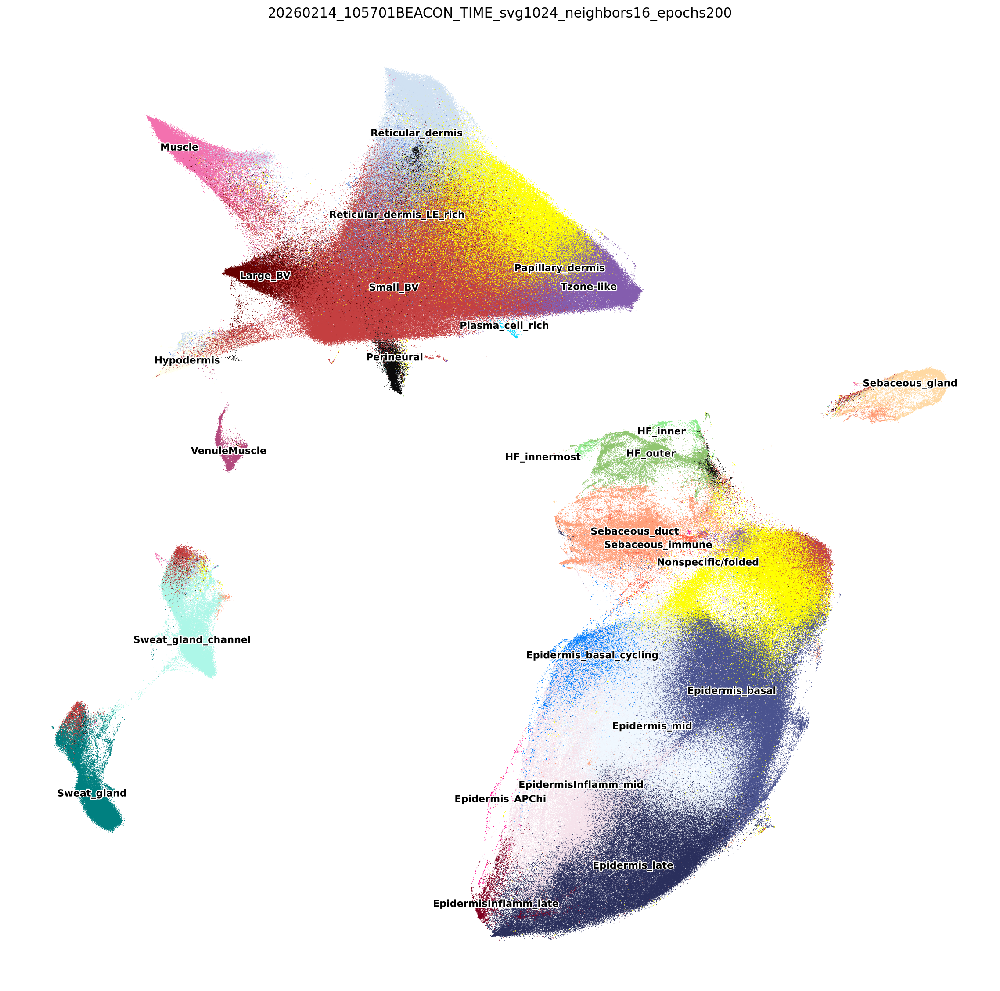

In [11]:
for MODEL in runs:
    print(MODEL)
    try:
        BASE=f'/lustre/scratch124/cellgen/haniffa/projects/developmental_fibroblasts/nobackup_output/nichecompasss/nichecompass/artifacts/spatial_reference_mapping/{MODEL}/model/reference/'
        adata=sc.read_h5ad(BASE  + '/adata.h5ad' )
        #RENAME = {"nan":    'validation dataset'}
        #adata.obs["tmp"]=adata.obs["niche19"].map(RENAME)
        #adata.obs["niche19"]=adata.obs["tmp"].fillna(adata.obs["niche19"])
        adata=adata[adata.obs["niche19"]!="nan"].copy()
    #     sc.pl.umap(
    #         adata,
    #         color=["niche19"],
    #         #legend_loc="on data",
    #         s=1,
    #         legend_fontsize=10,
    #         legend_fontoutline=2,
    #         show=True,
    #         palette=colors_new2,
    #             title=MODEL,

    # #     linewidth=0.1,
    # #     edgecolor='grey',

    #   #   palette=["#F2F2F2",   "#87CEEB",    ],
    #         save=f"nc_run_{MODEL}.pdf"

    #     )
        sc.pl.umap(
            adata,
            color=["niche19"],
            legend_loc="on data",
            s=2,
            legend_fontsize=10,
            legend_fontoutline=2,
            show=True,
        palette=colors_new2,
                title=MODEL,

                    save=f"nc_run_{MODEL}_LEGENDON_biggerdots_novalidationdata.pdf"

    #     linewidth=0.1,
    #     edgecolor='grey',

      #   palette=["#F2F2F2",   "#87CEEB",    ],
       #     save="refmap_umap_refquery.pdf"

        )
        del(adata)
        import gc
        gc.collect()
    except:
        print("############")
        print("failed with: ", MODEL)
        print("############")


In [13]:
8


8

In [12]:
s

NameError: name 's' is not defined

# INC VALIDATION DATASET

In [ ]:
for MODEL in runs:
    try:
        BASE=f'/lustre/scratch124/cellgen/haniffa/projects/developmental_fibroblasts/nobackup_output/nichecompasss/nichecompass/artifacts/spatial_reference_mapping/{MODEL}/model/reference/'
        adata=sc.read_h5ad(BASE  + '/adata.h5ad' )
        RENAME = {"nan":    'validation dataset'}
        adata.obs["tmp"]=adata.obs["niche19"].map(RENAME)
        adata.obs["niche19"]=adata.obs["tmp"].fillna(adata.obs["niche19"])
    #     sc.pl.umap(
    #         adata,
    #         color=["niche19"],
    #         #legend_loc="on data",
    #         s=1,
    #         legend_fontsize=10,
    #         legend_fontoutline=2,
    #         show=True,
    #         palette=colors_new2,
    #             title=MODEL,

    # #     linewidth=0.1,
    # #     edgecolor='grey',

    #   #   palette=["#F2F2F2",   "#87CEEB",    ],
    #         save=f"nc_run_{MODEL}.pdf"

    #     )
        sc.pl.umap(
            adata,
            color=["niche19"],
            legend_loc="on data",
            s=0.5,
            legend_fontsize=10,
            legend_fontoutline=2,
            show=True,
        palette=colors_new2,
                title=MODEL,

                    save=f"nc_run_{MODEL}_LEGENDON.pdf"

    #     linewidth=0.1,
    #     edgecolor='grey',

      #   palette=["#F2F2F2",   "#87CEEB",    ],
       #     save="refmap_umap_refquery.pdf"

        )
        del(adata)
        import gc
        gc.collect()
    except:
        print("############")
        print("failed with: ", MODEL)
        print("############")


# INV VALIDATION DATASET

In [ ]:
for MODEL in runs:
    try:
        BASE=f'/lustre/scratch124/cellgen/haniffa/projects/developmental_fibroblasts/nobackup_output/nichecompasss/nichecompass/artifacts/spatial_reference_mapping/{MODEL}/model/reference/'
        adata=sc.read_h5ad(BASE  + '/adata.h5ad' )
        RENAME = {"nan":    'validation dataset'}
        adata.obs["tmp"]=adata.obs["niche19"].map(RENAME)
        adata.obs["niche19"]=adata.obs["tmp"].fillna(adata.obs["niche19"])
    #     sc.pl.umap(
    #         adata,
    #         color=["niche19"],
    #         #legend_loc="on data",
    #         s=1,
    #         legend_fontsize=10,
    #         legend_fontoutline=2,
    #         show=True,
    #         palette=colors_new2,
    #             title=MODEL,

    # #     linewidth=0.1,
    # #     edgecolor='grey',

    #   #   palette=["#F2F2F2",   "#87CEEB",    ],
    #         save=f"nc_run_{MODEL}.pdf"

    #     )
        sc.pl.umap(
            adata,
            color=["niche19"],
            legend_loc="on data",
            s=2,
            legend_fontsize=10,
            legend_fontoutline=2,
            show=True,
        palette=colors_new2,
                title=MODEL,

                    save=f"nc_run_{MODEL}_LEGENDON_biggerdots.pdf"

    #     linewidth=0.1,
    #     edgecolor='grey',

      #   palette=["#F2F2F2",   "#87CEEB",    ],
       #     save="refmap_umap_refquery.pdf"

        )
        del(adata)
        import gc
        gc.collect()
    except:
        print("############")
        print("failed with: ", MODEL)
        print("############")


In [ ]:
1

In [ ]:
stop

In [ ]:
adata

In [ ]:
# sc.pl.umap(
#         adata,
#         color=["batch_nc"],
#         #legend_loc="on data",
#         s=5,
#         legend_fontsize=10,
#         legend_fontoutline=2,
#         show=False,
# #     linewidth=0.1,
# #     edgecolor='grey',
    
#   #   palette=["#F2F2F2",   "#87CEEB",    ],
#    #     save="refmap_umap_refquery.pdf"

#     )

In [ ]:
sc.pl.umap(
        adata,
        color=["niche19"],
        #legend_loc="on data",
        s=5,
        legend_fontsize=10,
        legend_fontoutline=2,
        show=False,
    groups=["Sebaceous_immune", "Plasma_cell_rich"]
#     linewidth=0.1,
    
#     edgecolor='grey',
    
  #   palette=["#F2F2F2",   "#87CEEB",    ],
   #     save="refmap_umap_refquery.pdf"

    )

In [ ]:
# sc.pl.umap(
#         adata[adata.obs["batch_nc"]!="query"],
#         color=["niche19"],
#         #legend_loc="on data",
#         s=50,
#         legend_fontsize=10,
#         legend_fontoutline=2,
#         show=False,
# #     linewidth=0.1,
# #     edgecolor='grey',
    
#   #   palette=["#F2F2F2",   "#87CEEB",    ],
#    #     save="refmap_umap_refquery.pdf"

#     )

In [ ]:
# adata

In [ ]:
# 8

In [ ]:
rsc.pp.neighbors(adata,
                n_neighbors=20,
                use_rep='nichecompass_latent',
                key_added='neighborhood')
rsc.tl.umap(adata,
           neighbors_key='neighborhood',
          min_dist=0.1)





In [ ]:
# Set dataset params
emb_key = 'neighborhood'
latent_leiden_resolution = 3
latent_cluster_key = f'{emb_key}_emb_leiden_res{str(latent_leiden_resolution).replace(".", "_")}'


In [ ]:
adata

In [ ]:
rsc.tl.leiden(adata,
            neighbors_key=emb_key,
             key_added=latent_cluster_key,
             resolution=latent_leiden_resolution)


In [ ]:
sc.pl.umap(adata,
           # neighbors_key='neighborhood',
           color="latent_leiden_1",
          legend_loc="on data",
          )
sc.pl.umap(adata,
           # neighbors_key='neighborhood',
           color=latent_cluster_key,
          legend_loc="on data",
          )

In [ ]:
1

In [ ]:
# latent_cluster_key = f'{emb_key}_emb_leiden_res{str(latent_leiden_resolution).replace(".", "_")}'


In [ ]:
sc.settings.set_figure_params(dpi=50, dpi_save=300, facecolor="white", frameon=False, figsize=(18,18),
                                   vector_friendly=True
                             )
sc.pl.umap(adata,
           # neighbors_key='neighborhood',
           color="niche19")

In [ ]:
adata

In [ ]:
sc.settings.set_figure_params(dpi=50, dpi_save=300, facecolor="white", frameon=False, figsize=(18,18),
                                   vector_friendly=True
                             )
sc.pl.umap(adata,
           # neighbors_key='neighborhood',
           color="latent_leiden_1")

In [ ]:
RENAME = {}
GROUP = latent_cluster_key
#"latent_leiden_1" #"latent_leiden3"
ANNO_COL = "niche19"


In [ ]:

#adata_i = adata.copy()
for cluster in sorted(adata.obs[GROUP].unique()):
    # Subset the dataframe to that cluster
    #adata_i=adata_i[adata_i.obs["tech"]!="xenium"]
    #adata_i=adata_i[adata_i.obs[ANNO_COL]!=  'fibroblast progenitors PDGFRA+']
    #adata_i=adata_i[adata_i.obs[ANNO_COL].str.lower()!=  'fibroblast progenitors PDGFRA+']
   # adata_i=adata_i[adata_i.obs[ANNO_COL]!=  'FIBROBLAST PROGENITORS PDGFRA+']
    #adata_i=adata_i[adata_i.obs[ANNO_COL]!=  'nan']

  #  adata_i=adata[adata_i.obs[ANNO_COL]!=  'reticulocyte']

    subset = adata.obs[adata.obs[GROUP] == cluster]
    # Count the values in combined_anno
    counts2 = subset[ANNO_COL].value_counts()
    
    # # Print top 3 contributors
    # print(f"Cluster {cluster} — Top 3 contributors:")
    # print(counts2.head(3), "\n")
    
    # Store the top contributor in RENAME
    if not counts2.empty:
        RENAME[cluster] = counts2.index[0]


        
adata.obs["provisional"]=adata.obs[GROUP].map(RENAME)
sc.pl.umap(
    adata,#[adata.obs["new_;ab"].isin(counts[counts >= 30].index)],
    color=[
         "provisional",  ANNO_COL
    ],
    legend_loc="on data",
    s=100, #neighbors_key="n",
    legend_fontsize=17,
    legend_fontoutline=2,
    # frame_on=False
 
)


In [ ]:
[x for x in adata.obs["info_id6"].unique() if "day" in x.lower()]

In [ ]:
# colors_new2 = {'Papillary_dermis': '#f2e2a2',
#  'Sweat_gland': "#5ed7cc",
#  'Sweat_gland_channel': '#afddd7',
#  'Muscle': '#c2eecc',
#  'Hypodermis': '#FFFFF0',
#  'Perineural': '#0A0A0A',
#  'Nonspecific': '#D3D3D3',
#  'Reticular_dermis': "#cbcfe6",#'#c2eecc',
#  'Large_BV': '#b9708b',
#  'Small_BV': '#c9456b',
#  'Tzone-like': '#845DAE',
#  'Sebaceous_gland': '#e79d2c',
#  'Sebaceous_immune': '#ff6145',
#  'Plasma_cell_niche': '#1F51FF',
#            'Epidermis_basal': '#033d9e',

#  'Epidermis_APChi': '#ff1493',
#  'Epidermis_late': '#2a2f5c',
#  'Epidermis_mid1': '#dcccce',
#  'Epidermis_mid2': '#FFFFFF',
#            'Epidermis_mid3': '#828ab7',

#  'Reticular_dermis_LE_rich': '#6A8ED8',
#  'Tzone-like_Theavy': '#B19CD9',
#  'Reticular dermis_F2/F3hi': '#35476C',
#  'Epidermis_basal_TRMhi': '#FF0000',
#  'HF_outer': '#828ab7',
#  'VenuleMuscle': '#FF69B4',
#  'Sebaceous_duct': '#FFA07A',
#  'VenuleEndothelium': '#8B0000',
#  'HF_inner': '#c2eecc',
#  'HF_Perifollicular': '#39FF14',
#  'Epidermis_basal_cycling': '#007cfe',
#  'Peri_sweat_gland': '#d9f9f7',
#  'HF_innermost': '#D95D54',
#  'Folded': '#D9D9D6',
# 'Sebaceous_inner_immune': '#F6A85C'}
colors_new2 = {
        'Epidermis_basal': "#4a538f",# "#3489f1", #"#000080", #"#f0f8ff", #"#007cfe",#'#4f59a1',  # dark blue
    "Epidermis basal":"#3489f1",# "#000080", #"#f0f8ff", #"#000080",
    
                'Epidermis_mid': '#F0F8FF', # #e3e7eb - GREY
  #  "Epidermis_late": "#4682B4", #"#A52A2A",          # pink
            'Epidermis_late':"#2a2f5c",#"#2a2f5c" ,# "#2e2e2e",#'#b1dae6',  # light blue

   'Epidermis basal_cycling': "#007cfe",  #  e2d8dd   "#505aa1",#"#c590a5" , # '#e0c5d2',
'Epidermis_basal_cycling': "#007cfe", 
'EpidermisInflamm_mid':"#f6e3ec",
        'EpidermisInflamm_late': "#800020",
    
    
    # 'Epidermis_Inflammatory': '#f2e7ed',
        "Epidermis_APChi": "#ff1493",
    'Papillary_dermis':"#FFFF00", # "#f6d17a", # yellow
    
  #  'Perivascular':  "#845DAE", #  '#fedbe7' PINKSIH,  #'#f8daeb',  # darkish red
    'Small blood vessel': "#d73435", #'#fe78bb',  # bright red
    'Sweat_gland': '#008080',  # dark grey
        'Sweat_gland_channel': "#adf7e8", #'#008080',  # original - 40E0D0
    'Muscle': "#f371af",  # very dark red
    'Adipocyte+vessels': "#B8860B", #'#FF4500',  # very dark orange
     'Hypodermis': "#FFFFF0", #"#D2B48C",#' # yello  # white = '#ffffff',
    'Larger blood vessel': "#660000",#"#8B0000", #'#FF6347',  # coral red
    'Perineural': '#0A0A0A',  # almost black
   # 'Plasma+pDC': '#808080',  # bright turquoise
    #'Sweat gland channel': '#000000',  # black
    #'KC_immunecell': '#FF1493',  # dark pink
    
   # 'Epidermis_late': '#b1dae6',
    "Nonspecific":"#D3D3D3",
     'Reticular_dermis': '#d0e1f2',

 'Large_BV': '#660000',
 'Small_BV': "#c43f40",#'#D96B6B',
     'Tzone-like': "#845DAE",# '#F4D1A1',

 'Sebaceous_gland': "#FFD9A3",      #  "#FFB347",#"#94cb72",#'#e28743',
"Sebaceous_immune": "#ff6145", 
 #'Plasma_cell_niche': "#1F51FF", #"#FFB300",#"#40E0D0",#'#ff5e00',
   # 'Plasma_cell_rich':  "#8080B2", #"
"Plasma_cell_rich": "#04D9FF",
    'HF_Perineural': '#00FF00',
    "OuterHF": "#006600",# 
 'Sebaceous duct': '#e28743',


"Lymphoid Tzone-like": "#825bac",
    



     #007FFF
    "Reticular_dermis_LE_rich" : "#6A8ED8",
        "Reticular_dermis_LErich" : "#6A8ED8",
    "Small_BV_Trich": "#FFB6C1",          # neon orange
    "Tzone-like_Theavy": "#B19CD9",       # light purple
    #"Reticular dermis_F2/F3hi": "#35476C", #"#FF5F1F",# light blue
    "HF_outer": "#90c670",                # very dark green
    "VenuleMuscle": "#B34A7E",

    "Sebaceous_duct": "#FFA07A",          # light orange (salmony)
    "VenuleEndothelium": "#8B0000",       # dark red
    "HF_inner": "#90EE90",                 # light green
    "HF_TNN+COCH+hi": "#39FF14",          # neon green
    # "Peri_sweat_gland": "#d9f9f7",
    'HF_innermost':  "#D95D54",
  #  'Sebaceous_inner_immune':"#F6A85C",
    'Nonspecific/folded': "#F0F0F0",
 'nan': '#FAFAFA',
        'Epidermis_basal': "#4a538f",# "#3489f1", #"#000080", #"#f0f8ff", #"#007cfe",#'#4f59a1',  # dark blue
    "Epidermis basal":"#3489f1",# "#000080", #"#f0f8ff", #"#000080",
    
                'Epidermis_mid': '#F0F8FF', # #e3e7eb - GREY
  #  "Epidermis_late": "#4682B4", #"#A52A2A",          # pink
            'Epidermis_late':"#2a2f5c",#"#2a2f5c" ,# "#2e2e2e",#'#b1dae6',  # light blue

   'Epidermis basal_cycling': "#007cfe",  #  e2d8dd   "#505aa1",#"#c590a5" , # '#e0c5d2',
'Epidermis_basal_cycling': "#007cfe", 
'EpidermisInflamm_mid':"#f6e3ec",
        'EpidermisInflamm_late': "#800020",
    
    
    # 'Epidermis_Inflammatory': '#f2e7ed',
        "Epidermis_APChi": "#ff1493",
    'Papillary_dermis':"#FFFF00", # "#f6d17a", # yellow
    
  #  'Perivascular':  "#845DAE", #  '#fedbe7' PINKSIH,  #'#f8daeb',  # darkish red
    'Small blood vessel': "#d73435", #'#fe78bb',  # bright red
    'Sweat_gland': '#008080',  # dark grey
        'Sweat_gland_channel': "#adf7e8", #'#008080',  # original - 40E0D0
    'Muscle': "#f371af",  # very dark red
    'Adipocyte+vessels': "#B8860B", #'#FF4500',  # very dark orange
     'Hypodermis': "#FFFFF0", #"#D2B48C",#' # yello  # white = '#ffffff',
    'Larger blood vessel': "#660000",#"#8B0000", #'#FF6347',  # coral red
    'Perineural': '#0A0A0A',  # almost black
   # 'Plasma+pDC': '#808080',  # bright turquoise
    #'Sweat gland channel': '#000000',  # black
    #'KC_immunecell': '#FF1493',  # dark pink
    
   # 'Epidermis_late': '#b1dae6',
    "Nonspecific":"#D3D3D3",
     'Reticular_dermis': '#d0e1f2',

 'Large_BV': '#660000',
 'Small_BV': "#c43f40",#'#D96B6B',
     'Tzone-like': "#845DAE",# '#F4D1A1',

 'Sebaceous_gland': "#FFD9A3",      #  "#FFB347",#"#94cb72",#'#e28743',
"Sebaceous_immune": "#ff6145", 
 #'Plasma_cell_niche': "#1F51FF", #"#FFB300",#"#40E0D0",#'#ff5e00',
   # 'Plasma_cell_rich':  "#8080B2", #"
"Plasma_cell_rich": "#04D9FF",
    'HF_Perineural': '#00FF00',
    "OuterHF": "#006600",# 
 'Sebaceous duct': '#e28743',


"Lymphoid Tzone-like": "#825bac",
    



     #007FFF
    "Reticular_dermis_LE_rich" : "#6A8ED8",
        "Reticular_dermis_LErich" : "#6A8ED8",
    "Small_BV_Trich": "#FFB6C1",          # neon orange
    "Tzone-like_Theavy": "#B19CD9",       # light purple
    #"Reticular dermis_F2/F3hi": "#35476C", #"#FF5F1F",# light blue
    "HF_outer": "#90c670",                # very dark green
    "VenuleMuscle": "#B34A7E",

    "Sebaceous_duct": "#FFA07A",          # light orange (salmony)
    "VenuleEndothelium": "#8B0000",       # dark red
    "HF_inner": "#90EE90",                 # light green
    "HF_TNN+COCH+hi": "#39FF14",          # neon green
    # "Peri_sweat_gland": "#d9f9f7",
    'HF_innermost':  "#D95D54",
  #  'Sebaceous_inner_immune':"#F6A85C",
    'Nonspecific/folded': "#F0F0F0",
 'nan': '#FAFAFA'
    
    }

# sc.settings.set_figure_params(dpi=50, facecolor="white", frameon=False, figsize=(30,30))

# adata.obs['niche17'] =adata.obs['niche17'] .astype('category')
# adata.uns['niche17_colors'] = [colors_new2.get(cat, '#D3D3D3')  # Default to light grey if not found
#                                      for cat in adata.obs['niche17'].cat.categories]
    
# sc.pl.umap(adata, 
#            color=["niche17"  ],
#            size=3, 
#            legend_loc="on data", 
#            vmax="p99", 
#            legend_fontsize=12,
#           legend_fontoutline=2,
#            linewidth=0.02,
#            edgecolor='white',
#           )
# sc.settings.set_figure_params(dpi=50, facecolor="white", frameon=False, figsize=(18,18))




for i,x in enumerate([ 'BK23_Day 3','BK23_Day 14' ]):
    adata_i=adata[adata.obs["info_id6"]==x]
    adata_i.obs['niche19'] =adata_i.obs['niche19'] .astype('category')
    adata_i.uns['niche19_colors'] = [colors_new2.get(cat, '#D3D3D3')  # Default to light grey if not found
                                     for cat in adata_i.obs['niche19'].cat.categories]
    print(x)
#     sc.pl.spatial(
#         adata_i,#[adata_i.obs["Timepoint"].str.startswith("Les")],
#         #library_id="spatial",
#         #shape=None,
#         color="niche19",
#         spot_size=10,
#         vmax=1,
#         #title=str(STATUS) + "_" + DONOR_ID,
#         #title=INFO_ID, #+ "_nonlesional",
#      legend_loc=None,
#         # legend_loc="on data",
#                 edgecolor="black",
#         linewidth=0.05,
#                 legend_fontsize=12,
#         title="",
#         #save="fig2_day14_by_niche_legend.pdf"

#         #ax=ax,
#         #legend_loc="on data"  # Disable the legend for each subplot
#     )
    sc.pl.spatial(
        adata_i,#[adata_i.obs["Timepoint"].str.startswith("Les")],
        #library_id="spatial",
        #shape=None,
        color="provisional",
        spot_size=10,
        vmax=1,
        #title=str(STATUS) + "_" + DONOR_ID,
        #title=INFO_ID, #+ "_nonlesional",
     legend_loc=None,
        # legend_loc="on data",
                edgecolor="black",
        linewidth=0.1,
                legend_fontsize=12,
        title="",
        palette=colors_new2,
        #save="fig2_day14_by_niche_legend.pdf"

        #ax=ax,
        #legend_loc="on data"  # Disable the legend for each subplot
    )
    if i>30:
        break

In [ ]:
[x for x in adata.obs["info_id6"].unique() if "day 3" in x.lower()]

In [ ]:
SAMPLES= ['BK22_Day 3',
 'BK23_Day 3',
 'BK21_Day 3',
 'BK18_Day 3',
 'BK27_Day 3',
 'BK20_Day 3',
 'BK25_Day 3',
 'BK30_Day 3',
 'BK24_Day 3',
 'BK39_Day 3']
 


for i,x in enumerate( SAMPLES ):
    adata_i=adata[adata.obs["info_id6"]==x]
    adata_i.obs['niche19'] =adata_i.obs['niche19'] .astype('category')
    adata_i.uns['niche19_colors'] = [colors_new2.get(cat, '#D3D3D3')  # Default to light grey if not found
                                     for cat in adata_i.obs['niche19'].cat.categories]
    print(x)
#     sc.pl.spatial(
#         adata_i,#[adata_i.obs["Timepoint"].str.startswith("Les")],
#         #library_id="spatial",
#         #shape=None,
#         color="niche19",
#         spot_size=10,
#         vmax=1,
#         #title=str(STATUS) + "_" + DONOR_ID,
#         #title=INFO_ID, #+ "_nonlesional",
#      legend_loc=None,
#         # legend_loc="on data",
#                 edgecolor="black",
#         linewidth=0.05,
#                 legend_fontsize=12,
#         title="",
#         #save="fig2_day14_by_niche_legend.pdf"

#         #ax=ax,
#         #legend_loc="on data"  # Disable the legend for each subplot
#     )
    sc.pl.spatial(
        adata_i,#[adata_i.obs["Timepoint"].str.startswith("Les")],
        #library_id="spatial",
        #shape=None,
        color="provisional",
        spot_size=10,
        vmax=1,
        #title=str(STATUS) + "_" + DONOR_ID,
        #title=INFO_ID, #+ "_nonlesional",
     legend_loc=None,
        # legend_loc="on data",
                edgecolor="black",
        linewidth=0.3,
                legend_fontsize=12,
        title="",
        palette=colors_new2,
        #save="fig2_day14_by_niche_legend.pdf"

        #ax=ax,
        #legend_loc="on data"  # Disable the legend for each subplot
    )
    if i>30:
        break

In [ ]:
SAMPLES=['BK23_Day 14',
 'BK22_Day 14',
 'BK27_Day 14',
 'BK20_Day 14',
 'BK21_Day 14',
 'BK18_Day 14',
 'BK25_Day 14',
 'BK24_Day 14',
 'BK39_Day 14',
 'BK30_Day 14']
 


for i,x in enumerate( SAMPLES ):
    adata_i=adata[adata.obs["info_id6"]==x]
    adata_i.obs['niche19'] =adata_i.obs['niche19'] .astype('category')
    adata_i.uns['niche19_colors'] = [colors_new2.get(cat, '#D3D3D3')  # Default to light grey if not found
                                     for cat in adata_i.obs['niche19'].cat.categories]
    print(x)
#     sc.pl.spatial(
#         adata_i,#[adata_i.obs["Timepoint"].str.startswith("Les")],
#         #library_id="spatial",
#         #shape=None,
#         color="niche19",
#         spot_size=10,
#         vmax=1,
#         #title=str(STATUS) + "_" + DONOR_ID,
#         #title=INFO_ID, #+ "_nonlesional",
#      legend_loc=None,
#         # legend_loc="on data",
#                 edgecolor="black",
#         linewidth=0.05,
#                 legend_fontsize=12,
#         title="",
#         #save="fig2_day14_by_niche_legend.pdf"

#         #ax=ax,
#         #legend_loc="on data"  # Disable the legend for each subplot
#     )
    sc.pl.spatial(
        adata_i,#[adata_i.obs["Timepoint"].str.startswith("Les")],
        #library_id="spatial",
        #shape=None,
        color="provisional",
        spot_size=10,
        vmax=1,
        #title=str(STATUS) + "_" + DONOR_ID,
        #title=INFO_ID, #+ "_nonlesional",
     legend_loc=None,
        # legend_loc="on data",
                edgecolor="black",
        linewidth=0.3,
                legend_fontsize=12,
        title="",
        palette=colors_new2,
        #save="fig2_day14_by_niche_legend.pdf"

        #ax=ax,
        #legend_loc="on data"  # Disable the legend for each subplot
    )
    if i>30:
        break

In [ ]:
9

In [ ]:
# colors_new2 = {'Papillary_dermis': '#f2e2a2',
#  'Sweat_gland': "#5ed7cc",
#  'Sweat_gland_channel': '#afddd7',
#  'Muscle': '#c2eecc',
#  'Hypodermis': '#FFFFF0',
#  'Perineural': '#0A0A0A',
#  'Nonspecific': '#D3D3D3',
#  'Reticular_dermis': "#cbcfe6",#'#c2eecc',
#  'Large_BV': '#b9708b',
#  'Small_BV': '#c9456b',
#  'Tzone-like': '#845DAE',
#  'Sebaceous_gland': '#e79d2c',
#  'Sebaceous_immune': '#ff6145',
#  'Plasma_cell_niche': '#1F51FF',
#            'Epidermis_basal': '#033d9e',

#  'Epidermis_APChi': '#ff1493',
#  'Epidermis_late': '#2a2f5c',
#  'Epidermis_mid1': '#dcccce',
#  'Epidermis_mid2': '#FFFFFF',
#            'Epidermis_mid3': '#828ab7',

#  'Reticular_dermis_LE_rich': '#6A8ED8',
#  'Tzone-like_Theavy': '#B19CD9',
#  'Reticular dermis_F2/F3hi': '#35476C',
#  'Epidermis_basal_TRMhi': '#FF0000',
#  'HF_outer': '#828ab7',
#  'VenuleMuscle': '#FF69B4',
#  'Sebaceous_duct': '#FFA07A',
#  'VenuleEndothelium': '#8B0000',
#  'HF_inner': '#c2eecc',
#  'HF_Perifollicular': '#39FF14',
#  'Epidermis_basal_cycling': '#007cfe',
#  'Peri_sweat_gland': '#d9f9f7',
#  'HF_innermost': '#D95D54',
#  'Folded': '#D9D9D6',
#  'Sebaceous_inner_immune': '#F6A85C'}




# for i,x in enumerate(adata_query.obs.sample_id.unique()):
#     adata_i=adata[adata.obs["info_id6"]==x]
#     adata_i.obs['niche19'] =adata_i.obs['niche19'] .astype('category')
#     adata_i.uns['niche19_colors'] = [colors_new2.get(cat, '#D3D3D3')  # Default to light grey if not found
#                                      for cat in adata_i.obs['niche19'].cat.categories]
#     print(x)
#     sc.pl.spatial(
#         adata_i,#[adata_i.obs["Timepoint"].str.startswith("Les")],
#         #library_id="spatial",
#         #shape=None,
#         color="niche19",
#         spot_size=10,
#         vmax=1,
#         #title=str(STATUS) + "_" + DONOR_ID,
#         #title=INFO_ID, #+ "_nonlesional",
#      legend_loc=None,
#         # legend_loc="on data",
#                 edgecolor="black",
#         linewidth=0.05,
#                 legend_fontsize=12,
#         title="",
#         #save="fig2_day14_by_niche_legend.pdf"

#         #ax=ax,
#         #legend_loc="on data"  # Disable the legend for each subplot
#     )
#     sc.pl.spatial(
#         adata_i,#[adata_i.obs["Timepoint"].str.startswith("Les")],
#         #library_id="spatial",
#         #shape=None,
#         color="provisional",
#         spot_size=10,
#         vmax=1,
#         #title=str(STATUS) + "_" + DONOR_ID,
#         #title=INFO_ID, #+ "_nonlesional",
#      legend_loc=None,
#         # legend_loc="on data",
#                 edgecolor="black",
#         linewidth=0.05,
#                 legend_fontsize=12,
#         title="",
#          #save = f"fig1a_{x}_byniche_WITHLEGEND.pdf"
#         #save="fig2_day14_by_niche_legend.pdf"

#         #ax=ax,
#         #legend_loc="on data"  # Disable the legend for each subplot
#     )
#     if i>30:
#         break

In [ ]:
colors_new2 = {
        'Epidermis_basal': "#4a538f",# "#3489f1", #"#000080", #"#f0f8ff", #"#007cfe",#'#4f59a1',  # dark blue
    "Epidermis basal":"#3489f1",# "#000080", #"#f0f8ff", #"#000080",
    
                'Epidermis_mid': '#F0F8FF', # #e3e7eb - GREY
  #  "Epidermis_late": "#4682B4", #"#A52A2A",          # pink
            'Epidermis_late':"#2a2f5c",#"#2a2f5c" ,# "#2e2e2e",#'#b1dae6',  # light blue

   'Epidermis basal_cycling': "#007cfe",  #  e2d8dd   "#505aa1",#"#c590a5" , # '#e0c5d2',
'Epidermis_basal_cycling': "#007cfe", 
'EpidermisInflamm_mid':"#f6e3ec",
        'EpidermisInflamm_late': "#800020",
    
    
    # 'Epidermis_Inflammatory': '#f2e7ed',
        "Epidermis_APChi": "#ff1493",
    'Papillary_dermis':"#FFFF00", # "#f6d17a", # yellow
    
  #  'Perivascular':  "#845DAE", #  '#fedbe7' PINKSIH,  #'#f8daeb',  # darkish red
    'Small blood vessel': "#d73435", #'#fe78bb',  # bright red
    'Sweat_gland': '#008080',  # dark grey
        'Sweat_gland_channel': "#adf7e8", #'#008080',  # original - 40E0D0
    'Muscle': "#f371af",  # very dark red
    'Adipocyte+vessels': "#B8860B", #'#FF4500',  # very dark orange
     'Hypodermis': "#FFFFF0", #"#D2B48C",#' # yello  # white = '#ffffff',
    'Larger blood vessel': "#660000",#"#8B0000", #'#FF6347',  # coral red
    'Perineural': '#0A0A0A',  # almost black
   # 'Plasma+pDC': '#808080',  # bright turquoise
    #'Sweat gland channel': '#000000',  # black
    #'KC_immunecell': '#FF1493',  # dark pink
    
   # 'Epidermis_late': '#b1dae6',
    "Nonspecific":"#D3D3D3",
     'Reticular_dermis': '#d0e1f2',

 'Large_BV': '#660000',
 'Small_BV': "#c43f40",#'#D96B6B',
     'Tzone-like': "#845DAE",# '#F4D1A1',

 'Sebaceous_gland': "#FFD9A3",      #  "#FFB347",#"#94cb72",#'#e28743',
"Sebaceous_immune": "#ff6145", 
 #'Plasma_cell_niche': "#1F51FF", #"#FFB300",#"#40E0D0",#'#ff5e00',
   # 'Plasma_cell_rich':  "#8080B2", #"
"Plasma_cell_rich": "#04D9FF",
    'HF_Perineural': '#00FF00',
    "OuterHF": "#006600",# 
 'Sebaceous duct': '#e28743',


"Lymphoid Tzone-like": "#825bac",
    



     #007FFF
    "Reticular_dermis_LE_rich" : "#6A8ED8",
        "Reticular_dermis_LErich" : "#6A8ED8",
    "Small_BV_Trich": "#FFB6C1",          # neon orange
    "Tzone-like_Theavy": "#B19CD9",       # light purple
    #"Reticular dermis_F2/F3hi": "#35476C", #"#FF5F1F",# light blue
    "HF_outer": "#90c670",                # very dark green
    "VenuleMuscle": "#B34A7E",

    "Sebaceous_duct": "#FFA07A",          # light orange (salmony)
    "VenuleEndothelium": "#8B0000",       # dark red
    "HF_inner": "#90EE90",                 # light green
    "HF_TNN+COCH+hi": "#39FF14",          # neon green
    # "Peri_sweat_gland": "#d9f9f7",
    'HF_innermost':  "#D95D54",
  #  'Sebaceous_inner_immune':"#F6A85C",
    'Nonspecific/folded': "#F0F0F0",
 'nan': '#FAFAFA',
        'Epidermis_basal': "#4a538f",# "#3489f1", #"#000080", #"#f0f8ff", #"#007cfe",#'#4f59a1',  # dark blue
    "Epidermis basal":"#3489f1",# "#000080", #"#f0f8ff", #"#000080",
    
                'Epidermis_mid': '#F0F8FF', # #e3e7eb - GREY
  #  "Epidermis_late": "#4682B4", #"#A52A2A",          # pink
            'Epidermis_late':"#2a2f5c",#"#2a2f5c" ,# "#2e2e2e",#'#b1dae6',  # light blue

   'Epidermis basal_cycling': "#007cfe",  #  e2d8dd   "#505aa1",#"#c590a5" , # '#e0c5d2',
'Epidermis_basal_cycling': "#007cfe", 
'EpidermisInflamm_mid':"#f6e3ec",
        'EpidermisInflamm_late': "#800020",
    
    
    # 'Epidermis_Inflammatory': '#f2e7ed',
        "Epidermis_APChi": "#ff1493",
    'Papillary_dermis':"#FFFF00", # "#f6d17a", # yellow
    
  #  'Perivascular':  "#845DAE", #  '#fedbe7' PINKSIH,  #'#f8daeb',  # darkish red
    'Small blood vessel': "#d73435", #'#fe78bb',  # bright red
    'Sweat_gland': '#008080',  # dark grey
        'Sweat_gland_channel': "#adf7e8", #'#008080',  # original - 40E0D0
    'Muscle': "#f371af",  # very dark red
    'Adipocyte+vessels': "#B8860B", #'#FF4500',  # very dark orange
     'Hypodermis': "#FFFFF0", #"#D2B48C",#' # yello  # white = '#ffffff',
    'Larger blood vessel': "#660000",#"#8B0000", #'#FF6347',  # coral red
    'Perineural': '#0A0A0A',  # almost black
   # 'Plasma+pDC': '#808080',  # bright turquoise
    #'Sweat gland channel': '#000000',  # black
    #'KC_immunecell': '#FF1493',  # dark pink
    
   # 'Epidermis_late': '#b1dae6',
    "Nonspecific":"#D3D3D3",
     'Reticular_dermis': '#d0e1f2',

 'Large_BV': '#660000',
 'Small_BV': "#c43f40",#'#D96B6B',
     'Tzone-like': "#845DAE",# '#F4D1A1',

 'Sebaceous_gland': "#FFD9A3",      #  "#FFB347",#"#94cb72",#'#e28743',
"Sebaceous_immune": "#ff6145", 
 #'Plasma_cell_niche': "#1F51FF", #"#FFB300",#"#40E0D0",#'#ff5e00',
   # 'Plasma_cell_rich':  "#8080B2", #"
"Plasma_cell_rich": "#04D9FF",
    'HF_Perineural': '#00FF00',
    "OuterHF": "#006600",# 
 'Sebaceous duct': '#e28743',


"Lymphoid Tzone-like": "#825bac",
    



     #007FFF
    "Reticular_dermis_LE_rich" : "#6A8ED8",
        "Reticular_dermis_LErich" : "#6A8ED8",
    "Small_BV_Trich": "#FFB6C1",          # neon orange
    "Tzone-like_Theavy": "#B19CD9",       # light purple
    #"Reticular dermis_F2/F3hi": "#35476C", #"#FF5F1F",# light blue
    "HF_outer": "#90c670",                # very dark green
    "VenuleMuscle": "#B34A7E",

    "Sebaceous_duct": "#FFA07A",          # light orange (salmony)
    "VenuleEndothelium": "#8B0000",       # dark red
    "HF_inner": "#90EE90",                 # light green
    "HF_TNN+COCH+hi": "#39FF14",          # neon green
    # "Peri_sweat_gland": "#d9f9f7",
    'HF_innermost':  "#D95D54",
  #  'Sebaceous_inner_immune':"#F6A85C",
    'Nonspecific/folded': "#F0F0F0",
 'nan': '#FAFAFA'
    
    }

# sc.settings.set_figure_params(dpi=50, facecolor="white", frameon=False, figsize=(30,30))

# adata.obs['niche17'] =adata.obs['niche17'] .astype('category')
# adata.uns['niche17_colors'] = [colors_new2.get(cat, '#D3D3D3')  # Default to light grey if not found
#                                      for cat in adata.obs['niche17'].cat.categories]
    
# sc.pl.umap(adata, 
#            color=["niche17"  ],
#            size=3, 
#            legend_loc="on data", 
#            vmax="p99", 
#            legend_fontsize=12,
#           legend_fontoutline=2,
#            linewidth=0.02,
#            edgecolor='white',
#           )
# sc.settings.set_figure_params(dpi=50, facecolor="white", frameon=False, figsize=(18,18))


In [ ]:
adata[adata.obs["Timepoint"]=="nan"].obs.info_id6.value_counts()

In [ ]:
adata.obs["Timepoint"].value_counts()

In [ ]:
import gc
gc.collect()
KEEP = ['BK50_Past Lesional', 'BK49_Past Lesional wk8 relaspe', 'BK46_Never Lesional', 'BK51_Past Lesional wk8 relaspe', 'BK51_wk8 Relapse', 'BK46_Past Lesional', 'BK43_Past Lesional', 'BK43_Never Lesional', 'BK49_wk8 Relapse', 'BK49_Past Lesional', 'BK49_Never Lesional', 'BK51_Never Lesional', 'BK50_Never Lesional', 'BK51_Past Lesional']
adata_i = adata[~adata.obs["info_id6"].isin(KEEP)].copy()
adata_i=adata_i[adata_i.obs["Patient_status"]=="AD"].copy()
adata.obs.info_id6.value_counts()
adata_i=adata_i[adata_i.obs["Timepoint"]!="Day 14_HF"].copy()


In [ ]:

import pandas as pd
import matplotlib.pyplot as plt

# Copy obs
obs = adata_i.obs.copy()

# Ensure categorical
obs["Timepoint"] = obs["Timepoint"].astype("category")
obs["niche19"] = obs["provisional"].astype("category")

NICHES = ["Sebaceous_immune", "Plasma_cell_rich"]

# Full contingency table
ct_all = pd.crosstab(obs["Timepoint"], obs["niche19"])

# Subset columns of interest
ct_sub = ct_all[NICHES]

# Normalize by ALL cells per timepoint
ct_prop = ct_sub.div(ct_all.sum(axis=1), axis=0)

# Colors
colors = [colors_new2[n] for n in ct_prop.columns]

# Plota
fig, ax = plt.subplots(figsize=(10, 10))

ct_prop.plot(
    kind="bar",
    stacked=True,
    ax=ax,
    color=colors,
    edgecolor="black",
    linewidth=0.3
)

ax.set_xlabel("Timepoint")
ax.set_ylabel("Proportion of all cells")
ax.set_title("Starting treatment")

ax.legend(
    title="niche19",
    frameon=False
)

plt.tight_layout()
plt.show()

In [ ]:
adata[adata.obs["niche19"]=="Sebaceous_immune"].obs.info_id6.value_counts()


In [ ]:
adata[adata.obs["provisional"]=="Sebaceous_immune"].obs.info_id6.value_counts()

In [ ]:
stop

In [ ]:
PATH='/lustre/scratch124/cellgen/haniffa/projects/developmental_fibroblasts/nobackup_output/nichecompasss/nichecompass/artifacts/spatial_reference_mapping/20260204_203734BEACON_TIME_svg1024_neighbors8/model/reference//adata.h5ad.clustered'
adata=sc.read_h5ad(PATH)

In [ ]:
adata[adata.obs["provisional"]=="Sebaceous_immune"].obs.info_id6.value_counts()

In [ ]:
colors_new2 = {
        'Epidermis_basal': "#4a538f",# "#3489f1", #"#000080", #"#f0f8ff", #"#007cfe",#'#4f59a1',  # dark blue
    "Epidermis basal":"#3489f1",# "#000080", #"#f0f8ff", #"#000080",
    
                'Epidermis_mid': '#F0F8FF', # #e3e7eb - GREY
  #  "Epidermis_late": "#4682B4", #"#A52A2A",          # pink
            'Epidermis_late':"#2a2f5c",#"#2a2f5c" ,# "#2e2e2e",#'#b1dae6',  # light blue

   'Epidermis basal_cycling': "#007cfe",  #  e2d8dd   "#505aa1",#"#c590a5" , # '#e0c5d2',
'Epidermis_basal_cycling': "#007cfe", 
'EpidermisInflamm_mid':"#f6e3ec",
        'EpidermisInflamm_late': "#800020",
    
    
    # 'Epidermis_Inflammatory': '#f2e7ed',
        "Epidermis_APChi": "#ff1493",
    'Papillary_dermis':"#FFFF00", # "#f6d17a", # yellow
    
  #  'Perivascular':  "#845DAE", #  '#fedbe7' PINKSIH,  #'#f8daeb',  # darkish red
    'Small blood vessel': "#d73435", #'#fe78bb',  # bright red
    'Sweat_gland': '#008080',  # dark grey
        'Sweat_gland_channel': "#adf7e8", #'#008080',  # original - 40E0D0
    'Muscle': "#f371af",  # very dark red
    'Adipocyte+vessels': "#B8860B", #'#FF4500',  # very dark orange
     'Hypodermis': "#FFFFF0", #"#D2B48C",#' # yello  # white = '#ffffff',
    'Larger blood vessel': "#660000",#"#8B0000", #'#FF6347',  # coral red
    'Perineural': '#0A0A0A',  # almost black
   # 'Plasma+pDC': '#808080',  # bright turquoise
    #'Sweat gland channel': '#000000',  # black
    #'KC_immunecell': '#FF1493',  # dark pink
    
   # 'Epidermis_late': '#b1dae6',
    "Nonspecific":"#D3D3D3",
     'Reticular_dermis': '#d0e1f2',

 'Large_BV': '#660000',
 'Small_BV': "#c43f40",#'#D96B6B',
     'Tzone-like': "#845DAE",# '#F4D1A1',

 'Sebaceous_gland': "#FFD9A3",      #  "#FFB347",#"#94cb72",#'#e28743',
"Sebaceous_immune": "#ff6145", 
 #'Plasma_cell_niche': "#1F51FF", #"#FFB300",#"#40E0D0",#'#ff5e00',
   # 'Plasma_cell_rich':  "#8080B2", #"
"Plasma_cell_rich": "#04D9FF",
    'HF_Perineural': '#00FF00',
    "OuterHF": "#006600",# 
 'Sebaceous duct': '#e28743',


"Lymphoid Tzone-like": "#825bac",
    



     #007FFF
    "Reticular_dermis_LE_rich" : "#6A8ED8",
        "Reticular_dermis_LErich" : "#6A8ED8",
    "Small_BV_Trich": "#FFB6C1",          # neon orange
    "Tzone-like_Theavy": "#B19CD9",       # light purple
    #"Reticular dermis_F2/F3hi": "#35476C", #"#FF5F1F",# light blue
    "HF_outer": "#90c670",                # very dark green
    "VenuleMuscle": "#B34A7E",

    "Sebaceous_duct": "#FFA07A",          # light orange (salmony)
    "VenuleEndothelium": "#8B0000",       # dark red
    "HF_inner": "#90EE90",                 # light green
    "HF_TNN+COCH+hi": "#39FF14",          # neon green
    # "Peri_sweat_gland": "#d9f9f7",
    'HF_innermost':  "#D95D54",
  #  'Sebaceous_inner_immune':"#F6A85C",
    'Nonspecific/folded': "#F0F0F0",
 'nan': '#FAFAFA'
    }

# sc.settings.set_figure_params(dpi=50, facecolor="white", frameon=False, figsize=(30,30))

# adata.obs['niche17'] =adata.obs['niche17'] .astype('category')
# adata.uns['niche17_colors'] = [colors_new2.get(cat, '#D3D3D3')  # Default to light grey if not found
#                                      for cat in adata.obs['niche17'].cat.categories]
    
# sc.pl.umap(adata, 
#            color=["niche17"  ],
#            size=3, 
#            legend_loc="on data", 
#            vmax="p99", 
#            legend_fontsize=12,
#           legend_fontoutline=2,
#            linewidth=0.02,
#            edgecolor='white',
#           )
# sc.settings.set_figure_params(dpi=50, facecolor="white", frameon=False, figsize=(18,18))


In [ ]:
sc.set_figure_params(
    dpi=50,
    dpi_save=300,
    figsize=(30, 30),
    facecolor='white',
    fontsize=7
)


i=0
#adata_5k=adata_5k[adata_5k.obs["Site_status_binary"]=="Lesional"]
for tissue_section_id in adata[adata.obs["provisional"]=="Sebaceous_immune"].obs.info_id6.value_counts().index[:10]:
    adata_i =  adata[adata.obs["info_id6"]==tissue_section_id] 
    sc.pl.spatial(
            adata_i,
            #library_id="spatial",
            #shape=None,
            color="provisional",
            spot_size=10,
            vmax=1,
        title=tissue_section_id,
           # title=STATUS + "_n=" + str(CELL_COUNT_IN_SECTION),
            #palette=custom_palette,
          #  save="perineural_mac_umap_NCIHE.pdf",
          edgecolor='black',
            linewidth=0.2 ,
       # groups="TRM_IL13+",
        #cmap="Reds", 
        palette=colors_new2
            #ax=ax,
            #legend_loc="on data"  # Disable the legend for each subplot
        )
          
      
# adata.write(BASE  + '/adata.h5ad.clustered' )

In [ ]:
sc.pl.umap(
        adata[adata.obs["batch_nc"]=="query"],
        color=["niche19"],
        #legend_loc="on data",
        s=50,
        legend_fontsize=10,
        legend_fontoutline=2,
        show=False,
#     linewidth=0.1,
#     edgecolor='grey',
    
  #   palette=["#F2F2F2",   "#87CEEB",    ],
   #     save="refmap_umap_refquery.pdf"

    )

In [ ]:

adata_i = adata.copy()
for cluster in sorted(adata.obs[GROUP].unique()):
    # Subset the dataframe to that cluster
    #adata_i=adata_i[adata_i.obs["tech"]!="xenium"]
    #adata_i=adata_i[adata_i.obs[ANNO_COL]!=  'fibroblast progenitors PDGFRA+']
    #adata_i=adata_i[adata_i.obs[ANNO_COL].str.lower()!=  'fibroblast progenitors PDGFRA+']
   # adata_i=adata_i[adata_i.obs[ANNO_COL]!=  'FIBROBLAST PROGENITORS PDGFRA+']
    adata_i=adata_i[adata_i.obs[ANNO_COL]!=  'nan']

    adata_i=adata_i[adata_i.obs[ANNO_COL]!=  'reticulocyte']

    subset = adata_i.obs[adata_i.obs[GROUP] == cluster]
    # Count the values in combined_anno
    counts2 = subset[ANNO_COL].value_counts()
    
    # # Print top 3 contributors
    # print(f"Cluster {cluster} — Top 3 contributors:")
    # print(counts2.head(3), "\n")
    
    # Store the top contributor in RENAME
    if not counts2.empty:
        RENAME[cluster] = counts2.index[0]


        
adata.obs["provisional"]=adata.obs[GROUP].map(RENAME)
sc.pl.umap(
    adata,#[adata.obs["new_;ab"].isin(counts[counts >= 30].index)],
    color=[
         "provisional",  ANNO_COL
    ],
    legend_loc="on data",
    s=100, #neighbors_key="n",
    legend_fontsize=17,
    legend_fontoutline=2,
    # frame_on=False
 
)


In [ ]:
sc.pl.umap(
        adata[adata.obs["batch_nc"]!="query"],
        color=["niche19"],
        #legend_loc="on data",
        s=50,
        legend_fontsize=10,
        legend_fontoutline=2,
        show=False,
#     linewidth=0.1,
#     edgecolor='grey',
    
  #   palette=["#F2F2F2",   "#87CEEB",    ],
   #     save="refmap_umap_refquery.pdf"

    )

In [ ]:
KEEP = ['BK50_Past Lesional', 'BK49_Past Lesional wk8 relaspe', 'BK46_Never Lesional', 'BK51_Past Lesional wk8 relaspe', 'BK51_wk8 Relapse', 'BK46_Past Lesional', 'BK43_Past Lesional', 'BK43_Never Lesional', 'BK49_wk8 Relapse', 'BK49_Past Lesional', 'BK49_Never Lesional', 'BK51_Never Lesional', 'BK50_Never Lesional', 'BK51_Past Lesional']
adata_i = adata[~adata.obs["info_id6"].isin(KEEP)].copy()
adata_i=adata_i[adata_i.obs["Patient_status"]=="AD"].copy()
adata.obs.info_id6.value_counts()
adata_i=adata_i[adata_i.obs["Timepoint"]!="Day 14_HF"].copy()


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Copy obs
obs = adata_i.obs.copy()

# Ensure categorical
obs["Timepoint"] = obs["Timepoint"].astype("category")
obs["niche19"] = obs["niche19"].astype("category")

NICHES = ["Sebaceous_immune", "Plasma_cell_rich"]

# Full contingency table
ct_all = pd.crosstab(obs["Timepoint"], obs["niche19"])

# Subset columns of interest
ct_sub = ct_all[NICHES]

# Normalize by ALL cells per timepoint
ct_prop = ct_sub.div(ct_all.sum(axis=1), axis=0)

# Colors
colors = [colors_new2[n] for n in ct_prop.columns]

# Plot
fig, ax = plt.subplots(figsize=(3, 4))

ct_prop.plot(
    kind="bar",
    stacked=True,
    ax=ax,
    color=colors,
    edgecolor="black",
    linewidth=0.3
)

ax.set_xlabel("Timepoint")
ax.set_ylabel("Proportion of all cells")
ax.set_title("Starting treatment")

ax.legend(
    title="niche19",
    frameon=False
)

plt.tight_layout()
plt.show()

In [ ]:
0

In [ ]:
# import scanpy as sc
# import rapids_singlecell as rsc
# import rmm
# import cupy as cp
# from rmm.allocators.cupy import rmm_cupy_allocator
 
# rmm.reinitialize(managed_memory=True, pool_allocator=False)
# cp.cuda.set_allocator(rmm_cupy_allocator)


In [ ]:
adata

In [ ]:
NEIGHBOR=20
sc.pp.neighbors(adata, use_rep = 'nichecompass_latent', metric = "euclidean", n_neighbors=NEIGHBOR,key_added=f"neighbor_{NEIGHBOR}")
sc.tl.umap(adata, min_dist=0.1, neighbors_key =f"neighbor_{NEIGHBOR}" )
latent_key = "neighbor_20"
# sc.tl.leiden(adata, resolution=2, key_added="latent_leiden2", #neighbors_key= latent_key 
#              )
import pickle

In [ ]:
md = adata.obs["latent_leiden2"].to_dict()

del(adata)
import gc
gc.collect()



In [ ]:
import os
BASE='//lustre/scratch124/cellgen/haniffa/projects/developmental_fibroblasts/nobackup_output/nichecompasss/nichecompass/artifacts/spatial_reference_mapping/20260116_114135XeniumMINTFLOWDATA__REFQ/model/'

os.listdir(BASE)
adata=sc.read_h5ad(BASE + 'reference_query' +'/adata.h5ad' )

In [ ]:
adata.obs['latent_leiden2']=adata.obs.index.map(md)

In [ ]:
RENAME = {}
GROUP = "latent_leiden2"
ANNO_COL = "niche19"

adata_i = adata.copy()
for cluster in sorted(adata.obs[GROUP].unique()):
    # Subset the dataframe to that cluster
    #adata_i=adata_i[adata_i.obs["tech"]!="xenium"]
    #adata_i=adata_i[adata_i.obs[ANNO_COL]!=  'fibroblast progenitors PDGFRA+']
    #adata_i=adata_i[adata_i.obs[ANNO_COL].str.lower()!=  'fibroblast progenitors PDGFRA+']
   # adata_i=adata_i[adata_i.obs[ANNO_COL]!=  'FIBROBLAST PROGENITORS PDGFRA+']
    adata_i=adata_i[adata_i.obs[ANNO_COL]!=  'nan']

    adata_i=adata_i[adata_i.obs[ANNO_COL]!=  'reticulocyte']

    subset = adata_i.obs[adata_i.obs[GROUP] == cluster]
    # Count the values in combined_anno
    counts2 = subset[ANNO_COL].value_counts()
    
    # # Print top 3 contributors
    # print(f"Cluster {cluster} — Top 3 contributors:")
    # print(counts2.head(3), "\n")
    
    # Store the top contributor in RENAME
    if not counts2.empty:
        RENAME[cluster] = counts2.index[0]


        
adata.obs["provisional"]=adata.obs[GROUP].map(RENAME)
sc.pl.umap(
    adata,#[adata.obs["new_;ab"].isin(counts[counts >= 30].index)],
    color=[
         "provisional",  ANNO_COL
    ],
    legend_loc="on data",
    s=100, #neighbors_key="n",
    legend_fontsize=17,
    legend_fontoutline=2,
    # frame_on=False
 
)


In [ ]:
adata.obs.batch_nc.value_counts()

In [ ]:
adata_query = adata[adata.obs["batch_nc"]=="query"].copy()

In [ ]:
colors_new2 = {'Papillary_dermis': '#f2e2a2',
 'Sweat_gland': "#5ed7cc",
 'Sweat_gland_channel': '#afddd7',
 'Muscle': '#c2eecc',
 'Hypodermis': '#FFFFF0',
 'Perineural': '#0A0A0A',
 'Nonspecific': '#D3D3D3',
 'Reticular_dermis': "#cbcfe6",#'#c2eecc',
 'Large_BV': '#b9708b',
 'Small_BV': '#c9456b',
 'Tzone-like': '#845DAE',
 'Sebaceous_gland': '#e79d2c',
 'Sebaceous_immune': '#ff6145',
 'Plasma_cell_niche': '#1F51FF',
           'Epidermis_basal': '#033d9e',

 'Epidermis_APChi': '#ff1493',
 'Epidermis_late': '#2a2f5c',
 'Epidermis_mid1': '#dcccce',
 'Epidermis_mid2': '#FFFFFF',
           'Epidermis_mid3': '#828ab7',

 'Reticular_dermis_LE_rich': '#6A8ED8',
 'Tzone-like_Theavy': '#B19CD9',
 'Reticular dermis_F2/F3hi': '#35476C',
 'Epidermis_basal_TRMhi': '#FF0000',
 'HF_outer': '#828ab7',
 'VenuleMuscle': '#FF69B4',
 'Sebaceous_duct': '#FFA07A',
 'VenuleEndothelium': '#8B0000',
 'HF_inner': '#c2eecc',
 'HF_Perifollicular': '#39FF14',
 'Epidermis_basal_cycling': '#007cfe',
 'Peri_sweat_gland': '#d9f9f7',
 'HF_innermost': '#D95D54',
 'Folded': '#D9D9D6',
 'Sebaceous_inner_immune': '#F6A85C'}




for i,x in enumerate(adata_query.obs.sample_id.unique()):
    adata_i=adata[adata.obs["info_id6"]==x]
    adata_i.obs['niche19'] =adata_i.obs['niche19'] .astype('category')
    adata_i.uns['niche19_colors'] = [colors_new2.get(cat, '#D3D3D3')  # Default to light grey if not found
                                     for cat in adata_i.obs['niche19'].cat.categories]
    print(x)
    sc.pl.spatial(
        adata_i,#[adata_i.obs["Timepoint"].str.startswith("Les")],
        #library_id="spatial",
        #shape=None,
        color="niche19",
        spot_size=10,
        vmax=1,
        #title=str(STATUS) + "_" + DONOR_ID,
        #title=INFO_ID, #+ "_nonlesional",
     legend_loc=None,
        # legend_loc="on data",
                edgecolor="black",
        linewidth=0.05,
                legend_fontsize=12,
        title="",
        #save="fig2_day14_by_niche_legend.pdf"

        #ax=ax,
        #legend_loc="on data"  # Disable the legend for each subplot
    )
    sc.pl.spatial(
        adata_i,#[adata_i.obs["Timepoint"].str.startswith("Les")],
        #library_id="spatial",
        #shape=None,
        color="provisional",
        spot_size=10,
        vmax=1,
        #title=str(STATUS) + "_" + DONOR_ID,
        #title=INFO_ID, #+ "_nonlesional",
     legend_loc=None,
        # legend_loc="on data",
                edgecolor="black",
        linewidth=0.05,
                legend_fontsize=12,
        title="",
         save = f"fig1a_{x}_byniche_WITHLEGEND.pdf"
        #save="fig2_day14_by_niche_legend.pdf"

        #ax=ax,
        #legend_loc="on data"  # Disable the legend for each subplot
    )
    if i>30:
        break